## Image Classification Using OpenCV and Neural Network

In [1]:
# pip install opencv-python

In [2]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt

In [3]:
data_link = 'https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip'

In [4]:
data_dir = keras.utils.get_file('Animal_data',origin = data_link, cache_dir = '.\DataSets',untar=True)

In [5]:
data_dir

'.\\DataSets\\datasets\\Animal_data'

In [6]:
import pathlib
data_dir = pathlib.Path(data_dir)
data_dir

WindowsPath('DataSets/datasets/Animal_data')

In [7]:
list(data_dir.glob('train/cats/*.jpg'))

[WindowsPath('DataSets/datasets/Animal_data/train/cats/cat.0.jpg'),
 WindowsPath('DataSets/datasets/Animal_data/train/cats/cat.1.jpg'),
 WindowsPath('DataSets/datasets/Animal_data/train/cats/cat.10.jpg'),
 WindowsPath('DataSets/datasets/Animal_data/train/cats/cat.100.jpg'),
 WindowsPath('DataSets/datasets/Animal_data/train/cats/cat.101.jpg'),
 WindowsPath('DataSets/datasets/Animal_data/train/cats/cat.102.jpg'),
 WindowsPath('DataSets/datasets/Animal_data/train/cats/cat.103.jpg'),
 WindowsPath('DataSets/datasets/Animal_data/train/cats/cat.104.jpg'),
 WindowsPath('DataSets/datasets/Animal_data/train/cats/cat.105.jpg'),
 WindowsPath('DataSets/datasets/Animal_data/train/cats/cat.106.jpg'),
 WindowsPath('DataSets/datasets/Animal_data/train/cats/cat.107.jpg'),
 WindowsPath('DataSets/datasets/Animal_data/train/cats/cat.108.jpg'),
 WindowsPath('DataSets/datasets/Animal_data/train/cats/cat.109.jpg'),
 WindowsPath('DataSets/datasets/Animal_data/train/cats/cat.11.jpg'),
 WindowsPath('DataSets/dat

In [8]:
len(list(data_dir.glob('train/cats/*.jpg')))

1001

In [9]:
cats = list(data_dir.glob('train/cats/*.jpg'))
dogs = list(data_dir.glob('train/dogs/*.jpg'))

In [10]:
cats[-1]

WindowsPath('DataSets/datasets/Animal_data/train/cats/my_cat.jpg')

In [11]:
import PIL

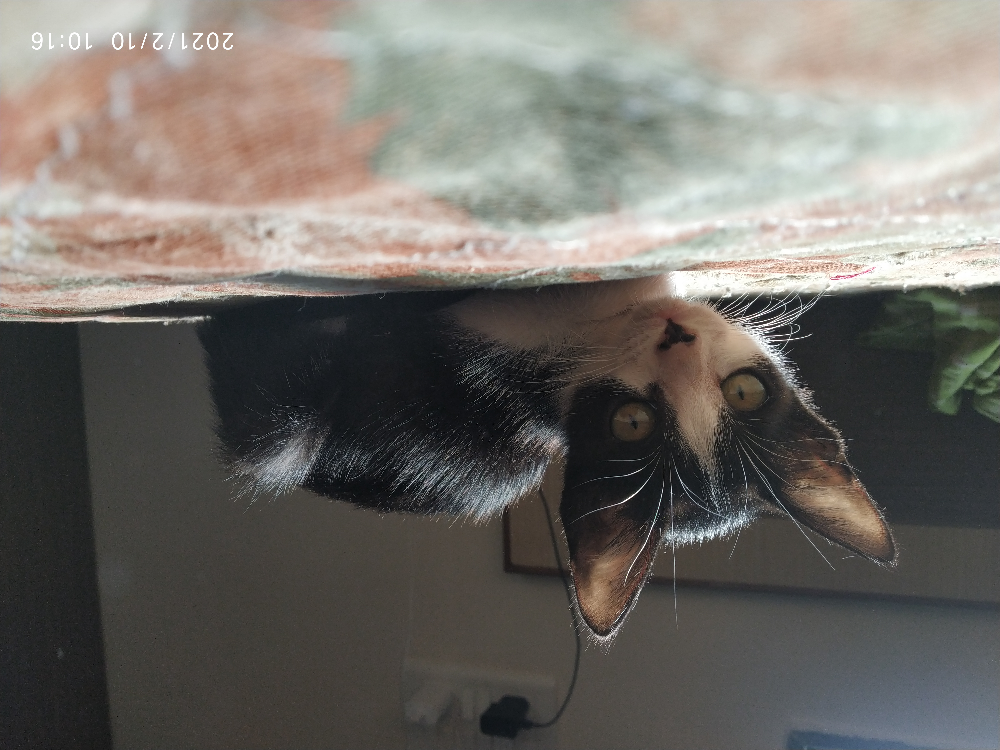

In [12]:
PIL.Image.open(str(cats[-1]))

In [13]:
class_dir = {
    
    "cat_dir" : list(data_dir.glob('train/cats/*.jpg')),
    "dog_dir" : list(data_dir.glob('train/dogs/*.jpg'))
    
}

In [14]:
class_dir["cat_dir"]

[WindowsPath('DataSets/datasets/Animal_data/train/cats/cat.0.jpg'),
 WindowsPath('DataSets/datasets/Animal_data/train/cats/cat.1.jpg'),
 WindowsPath('DataSets/datasets/Animal_data/train/cats/cat.10.jpg'),
 WindowsPath('DataSets/datasets/Animal_data/train/cats/cat.100.jpg'),
 WindowsPath('DataSets/datasets/Animal_data/train/cats/cat.101.jpg'),
 WindowsPath('DataSets/datasets/Animal_data/train/cats/cat.102.jpg'),
 WindowsPath('DataSets/datasets/Animal_data/train/cats/cat.103.jpg'),
 WindowsPath('DataSets/datasets/Animal_data/train/cats/cat.104.jpg'),
 WindowsPath('DataSets/datasets/Animal_data/train/cats/cat.105.jpg'),
 WindowsPath('DataSets/datasets/Animal_data/train/cats/cat.106.jpg'),
 WindowsPath('DataSets/datasets/Animal_data/train/cats/cat.107.jpg'),
 WindowsPath('DataSets/datasets/Animal_data/train/cats/cat.108.jpg'),
 WindowsPath('DataSets/datasets/Animal_data/train/cats/cat.109.jpg'),
 WindowsPath('DataSets/datasets/Animal_data/train/cats/cat.11.jpg'),
 WindowsPath('DataSets/dat

In [15]:
labels_dir = {
    
    "cat_dir":0,
    "dog_dir":1
    
}

In [16]:
import cv2

In [17]:
cat_img = cv2.imread(str(class_dir["cat_dir"][0]))
cat_img

array([[[ 87, 164, 203],
        [ 87, 164, 203],
        [ 88, 165, 204],
        ...,
        [122, 201, 240],
        [121, 200, 239],
        [120, 199, 238]],

       [[ 87, 164, 203],
        [ 87, 164, 203],
        [ 88, 165, 204],
        ...,
        [123, 202, 241],
        [122, 201, 240],
        [120, 199, 238]],

       [[ 87, 164, 203],
        [ 87, 164, 203],
        [ 88, 165, 204],
        ...,
        [123, 202, 241],
        [122, 201, 240],
        [121, 200, 239]],

       ...,

       [[ 55, 122, 153],
        [ 55, 122, 153],
        [ 55, 122, 153],
        ...,
        [  0,   2,   2],
        [  0,   2,   2],
        [  0,   2,   2]],

       [[ 54, 121, 152],
        [ 54, 121, 152],
        [ 54, 121, 152],
        ...,
        [  0,   2,   2],
        [  0,   2,   2],
        [  0,   2,   2]],

       [[ 53, 120, 151],
        [ 53, 120, 151],
        [ 53, 120, 151],
        ...,
        [  0,   1,   1],
        [  0,   1,   1],
        [  0,   1,   1]]

In [18]:
X,y = [],[]
for pet_name,images in class_dir.items():
    for image in images:
        img = cv2.imread(str(image))
        img_resize = cv2.resize(img,(180,180))
        X.append(img_resize)
        y.append(labels_dir[pet_name])

In [19]:
X[1]

array([[[ 40,  44,  39],
        [ 43,  44,  40],
        [ 46,  45,  41],
        ...,
        [170, 192, 194],
        [172, 203, 206],
        [163, 197, 200]],

       [[ 41,  45,  40],
        [ 43,  44,  40],
        [ 46,  44,  40],
        ...,
        [167, 189, 191],
        [166, 196, 200],
        [162, 194, 199]],

       [[ 39,  43,  38],
        [ 40,  41,  37],
        [ 41,  40,  35],
        ...,
        [164, 182, 186],
        [164, 191, 196],
        [168, 198, 204]],

       ...,

       [[ 26,  25,  27],
        [ 23,  22,  24],
        [ 19,  18,  21],
        ...,
        [ 32,  38,  52],
        [ 26,  32,  45],
        [ 27,  33,  44]],

       [[ 30,  29,  31],
        [ 25,  24,  26],
        [ 21,  20,  22],
        ...,
        [ 13,  19,  33],
        [ 17,  24,  37],
        [ 34,  41,  52]],

       [[ 30,  29,  31],
        [ 24,  23,  25],
        [ 19,  18,  20],
        ...,
        [ 27,  35,  49],
        [ 27,  35,  48],
        [ 24,  33,  44]]

In [20]:
X = np.array(X)
y = np.array(y)

In [21]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.2)

In [22]:
X_train_scale = X_train/255
X_test_scale = X_test/255

In [24]:
model = keras.Sequential([
    
        keras.layers.Conv2D(16,3,padding = 'same',activation = 'relu'),
        keras.layers.MaxPooling2D(),
        keras.layers.Conv2D(32,3,padding = 'same',activation = 'relu'),
        keras.layers.MaxPooling2D(),
    
        keras.layers.Flatten(),
        keras.layers.Dense(10,activation = 'relu'),
        keras.layers.Dense(2,activation = 'softmax')
    
])
model.compile(optimizer = 'adam',loss =  'sparse_categorical_crossentropy',metrics = ['accuracy'])

In [25]:
model.fit(X_train_scale,y_train,epochs = 5)

Epoch 1/5
50/50 [==============================] - 25s 470ms/step - loss: 0.7365 - accuracy: 0.5350
Epoch 2/5
50/50 [==============================] - 23s 452ms/step - loss: 0.6577 - accuracy: 0.6300
Epoch 3/5
50/50 [==============================] - 23s 458ms/step - loss: 0.6041 - accuracy: 0.6812
Epoch 4/5
50/50 [==============================] - 23s 457ms/step - loss: 0.5109 - accuracy: 0.7525
Epoch 5/5
50/50 [==============================] - 18s 366ms/step - loss: 0.4091 - accuracy: 0.8156


In [58]:
model.evaluate(X_test,y_test)

13/13 [==============================] - 2s 122ms/step - loss: 0.6797 - accuracy: 0.4663


[0.6796610355377197, 0.4663461446762085]

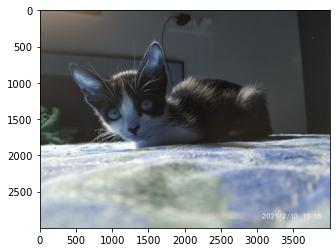

In [59]:
my_cat_img = cv2.imread(str(class_dir["cat_dir"][-1]))
plt.imshow(my_cat_img)

In [60]:
my_cat_img = my_cat_img / 255

In [61]:
my_cat_img = cv2.resize(my_cat_img,(180,180))

In [62]:
my_cat_img.shape,X_test_scale.shape

((180, 180, 3), (401, 180, 180, 3))

In [63]:
my_cat_img.shape , X_test_scale[0:1].shape

((180, 180, 3), (1, 180, 180, 3))

In [64]:
new_cat = my_cat_img.reshape(1,180,180,3)
new_cat.shape

(1, 180, 180, 3)

In [65]:
my_cat_pred = model.predict(new_cat)

In [66]:
np.argmax(my_cat_pred)
# 0 is cat

1